# Classifying ASL Letters in Real-Time

In the current notebook we will be creating a test set from a 200x200 pixel portion of webcam images taken in real-time. 

Twenty images will be taken for each class. 

Performance of the trained models will be evaluated based on accuracy, precision, recall and f1 scores, as well as a confusion matrix normalized by the number of samples in each class. 

In [1]:
# Importing libraries
import cv2
import numpy as np 
import pandas as pd 
from keras.models import load_model, model_from_json

# To evaluate the models
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt 
%matplotlib inline

Using TensorFlow backend.


First, creating a class that will allow us to read in the models with the best weights trained in: 

- VGG16_ASL.ipynb
- VGG19_ASL.ipynb
- xception_ASL.ipynb
- xception_noFC.ipynb
- squeezenet_ASL.ipynb

and have the models predict the webcam image's class. 

In [2]:
# Creating a list of the classes 
LETTER_LIST = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L',
      'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U',
      'V', 'W', 'X', 'Y', 'Z', 'delete', 'nothing', 'space']

# Preficing classes with 'Predicted ' 
predicted_labels = list('Predicted '  + letter for letter in LETTER_LIST)

# Preficing classes with 'True '
true_labels = list('True ' + letter for letter in LETTER_LIST)

# Sanity check 
print(predicted_labels, '\n\n', true_labels)

['Predicted A', 'Predicted B', 'Predicted C', 'Predicted D', 'Predicted E', 'Predicted F', 'Predicted G', 'Predicted H', 'Predicted I', 'Predicted J', 'Predicted K', 'Predicted L', 'Predicted M', 'Predicted N', 'Predicted O', 'Predicted P', 'Predicted Q', 'Predicted R', 'Predicted S', 'Predicted T', 'Predicted U', 'Predicted V', 'Predicted W', 'Predicted X', 'Predicted Y', 'Predicted Z', 'Predicted delete', 'Predicted nothing', 'Predicted space'] 

 ['True A', 'True B', 'True C', 'True D', 'True E', 'True F', 'True G', 'True H', 'True I', 'True J', 'True K', 'True L', 'True M', 'True N', 'True O', 'True P', 'True Q', 'True R', 'True S', 'True T', 'True U', 'True V', 'True W', 'True X', 'True Y', 'True Z', 'True delete', 'True nothing', 'True space']


In [3]:
class asl_model(object):

    def __init__(self, model_json_file, model_weights_file):
        # load model from JSON file
        with open(model_json_file, "r") as json_file:
            loaded_model_json = json_file.read()
            self.loaded_model = model_from_json(loaded_model_json)

        # load weights into the new model
        self.loaded_model.load_weights(model_weights_file)
        self.loaded_model._make_predict_function()

    def predict_image(self, img):
        '''
        Returns a predicted class for the image and the probability for that class.

        INPUTS
        ----
        model: the model to make a prediction 
        image: the image to predict

        OUTPUTS
        -----
        result: the class with the highest probability
        score: the probability score associated with that class for the image (the highest probability)
        '''  
        
        # Getting the array of all class probabilities
        preds = self.loaded_model.predict(img)
        
        # Determining the index of the highest probability and pulling the associated class from the list of classes ('LETTER_LIST')
        self.result = np.argmax(preds)
    
        # Saving the probability as a percentage with 2 decimal points to the variable 'score'
        self.score = float("%0.2f" % (max(preds[0]) * 100))
        return self.result, self.score

In [4]:
# Loading in the best model's architecture and weights

# VGG16
vgg16 = asl_model('VGG16/VGG16_all.json', 'VGG16/best_weights_vgg16.h5')

# VGG19
vgg19 = asl_model('VGG19/VGG19_all.json', 'VGG19/best_weights_vgg19.h5')

# Xception 
xception = asl_model('xception/xception_asl.json', 'xception/best_weights_xception.h5')

# Xception without additional Fully-Connected Layers
xception_nofc = asl_model('xception_noFC/xception_asl_nofc.json', 'xception_noFC/best_weights_xception_nofc.h5')

# SqueezeNet
squeezenet = asl_model('squeezenet/squeeze_asl.json', 'squeezenet/best_weights_squeeze.h5')

In [5]:
model_list = [vgg16, vgg19, xception, xception_nofc, squeezenet]

model_list

Now, creating a class that we will use to set up the webcam and preprocess the frames in preparation of being sent to the above models. 

In [6]:
class VideoCamera(object):
    
    def __init__(self):
        self.video = cv2.VideoCapture(0)
        self.video.set(cv2.CAP_PROP_FRAME_WIDTH, 640)
        self.video.set(cv2.CAP_PROP_FRAME_HEIGHT, 480)
    
    def __del__(self):
        self.video.release()
        cv2.destroyAllWindows()
        
    def exit_all(self):
        self.video.release()
        cv2.destroyAllWindows()
    
    def get_frame(self):
        '''
        Returns a predicted class for the image and the probability for that class.

        INPUTS
        ----
        model: the model to make a prediction 
        image: the image to predict

        OUTPUTS
        -----
        result: the class with the highest probability
        score: the probability score associated with that class for the image (the highest probability)
        '''  

        success, frame = self.video.read()

        # Horizontally flipping the video frame to mirror our actions (easier for the user to orient themselves)
        frame2=cv2.flip(frame, 1)

        # Selecting a 200x200 pixel window towards the right of the frame to capture the user's right hand  
        frame3 = frame2[100:300, 440:640]

        # Create a mask 2 pixels larger in height and width as per cv2.floodFill documentation
        # Outlining the hand
        detect_edge = cv2.Canny(frame3, 100, 100)
        # Adding 2 pixels in height and width
        edge_mask = cv2.copyMakeBorder(detect_edge,1,1,1,1,cv2.BORDER_REFLECT)

        # Create a copy of 'frame3' to floodFill
        to_model = frame3.copy()

        # Replace all neighbouring pixels that have similar RGB values as the 'seedPoint' pixel (starting point)
        # with white, 'newVal' of (255,255,255)
        cv2.floodFill(image=to_model, mask=edge_mask, seedPoint=(3,3), newVal=(255,255,255), 
                        loDiff=(2,151,100), upDiff=(2,151,100), flags=8)
        # Initiating at the other corners of the image
        cv2.floodFill(to_model, edge_mask, (199,2), (255,255,255), (2,151,65), (2,151,65), flags=8)
        cv2.floodFill(to_model, edge_mask, (199,197), (255,255,255), (2,151,65), (2,151,65), flags=8)
        cv2.floodFill(to_model, edge_mask, (2,197), (255,255,255), (2,151,100), (2,151,100), flags=8)

        # Will need to add a dimension as model expects (None, 200, 200, 3)
        frame4 = np.expand_dims(to_model, axis=0)
        
        return frame2, frame4, to_model

Putting everything together, running the next cell will initiate the real-time test!

In [8]:
# Variables for later formatting the text that will be printed on the display
font_type = cv2.FONT_HERSHEY_SIMPLEX
top_centre = (180,50)
font_size = 1
green_text = (0,255,0)
line_type = 2

# Need a dictionary
dict_images = {}

# dataframe for the models predictions
col_names = ['vgg16', 'vgg19', 'xception', 'xception_nofc', 'squeezenet','true']
df_predictions = pd.DataFrame(columns=col_names)

# Iterating through each class
for letter in LETTER_LIST:
    
    # Track frames
    a = 0

    # Creating an empty list for each class/letter (key)
    dict_images[letter] = []
    
    # Initiating the webcam
    camera = VideoCamera()
    
    # Until encountering a False (break)
    while True: 
    
        # Frame counter
        a += 1

        # Get the frame
        main_display, predict_img, predict_display = camera.get_frame()

        # Capturing 20 test images for each class

        if a <= 30:

            # Adding text to the flipped frame
            cv2.putText(main_display, f'Get your {letter} ready! {30-a}..', 
                        top_centre, font_type, font_size, green_text, line_type)

            # Displaying the frames

            # Entire frame (flipped for easier use)
            cv2.imshow("Say cheese!", main_display)

            # The image that gets "sent" to the model (prior to adding a dimension)
            cv2.imshow("To the model!", predict_display)

        elif (a > 30) & (a <=50):

            # Adding text to the flipped frame
            cv2.putText(main_display, f' {letter} {a-30}/20', 
                        top_centre, font_type, font_size, green_text, line_type)

            # Displaying the frames

            # Entire frame (flipped for easier use)
            cv2.imshow("Say cheese!", main_display)

            # The image that gets "sent" to the model (prior to adding a dimension)
            cv2.imshow("To the model!", predict_display)


            # Save the image models predicted on (predict_display) for later display
            dict_images[letter].append(predict_display)

            # Empty list to append model predictions to 
            predictions = []
            scores = []

            # Sending test image to the models 
            for model in model_list:

                prediction, score = model.predict_image(predict_img)

                # Append to list
                predictions.append(prediction)

            # Adding the true class 
            predictions.append(LETTER_LIST.index(letter))

            # New row to df_predictions
            model_results = pd.DataFrame(np.array(predictions).reshape(1,-1), columns=col_names)

            df_predictions = df_predictions.append(model_results, ignore_index=True)
            
        elif a > 51:
            break

        # Pressing the letter 'q' will break the while loop so script can proceed
        key=cv2.waitKey(1)
        if key == ord('q'):
            break
    
    # Exiting video capture and ridding of the displays
    camera.exit_all()

# Exiting video capture and ridding of the displays
camera.exit_all()

# Printing the number of frames that were captured and lists
print(f'Frames captured: {a}')

Frames captured: 52


## Visualizing some of the test images we captured

In [9]:
df_predictions = df_predictions.astype('int')

df_predictions

,vgg16,vgg19,xception,xception_nofc,squeezenet,true
0,0,0,14,25,0,0
1,0,0,14,25,0,0
2,0,0,14,25,0,0
3,0,0,14,25,0,0
4,0,0,14,25,0,0
...,...,...,...,...,...,...
575,28,28,14,25,28,28
576,28,28,14,25,28,28
577,28,28,14,25,28,28
578,28,28,14,25,28,28


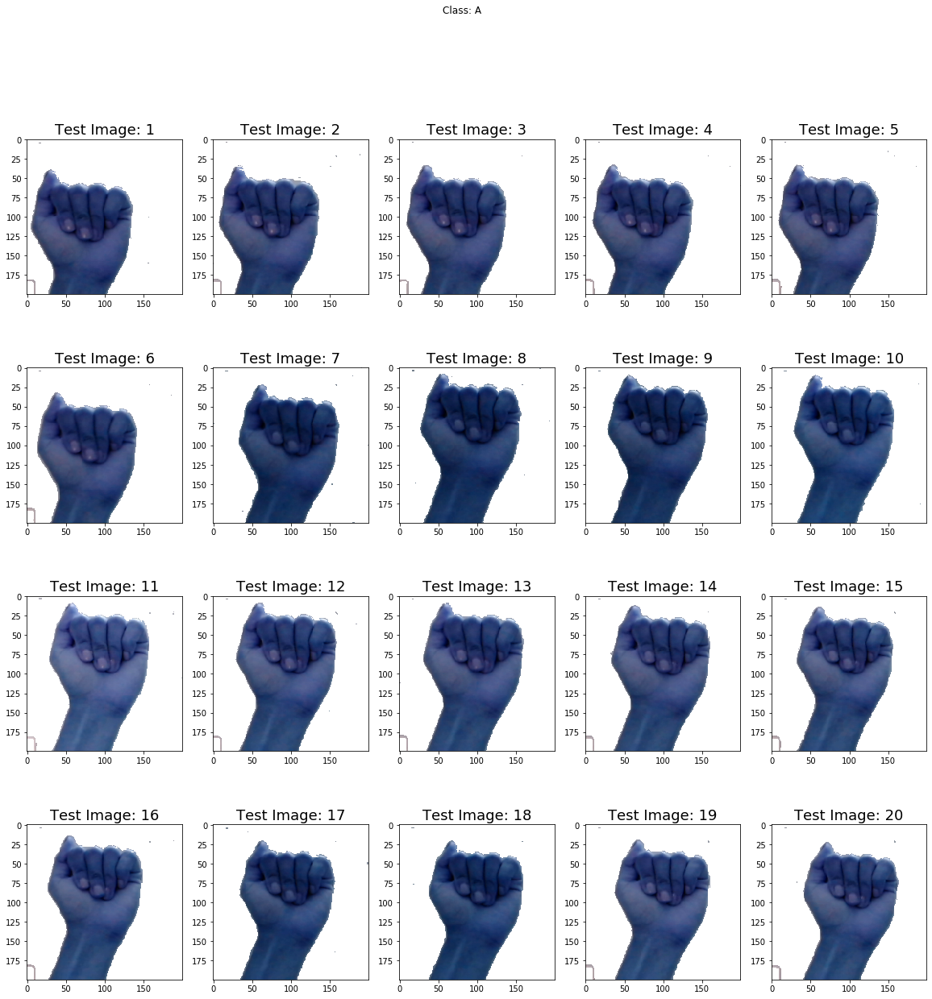

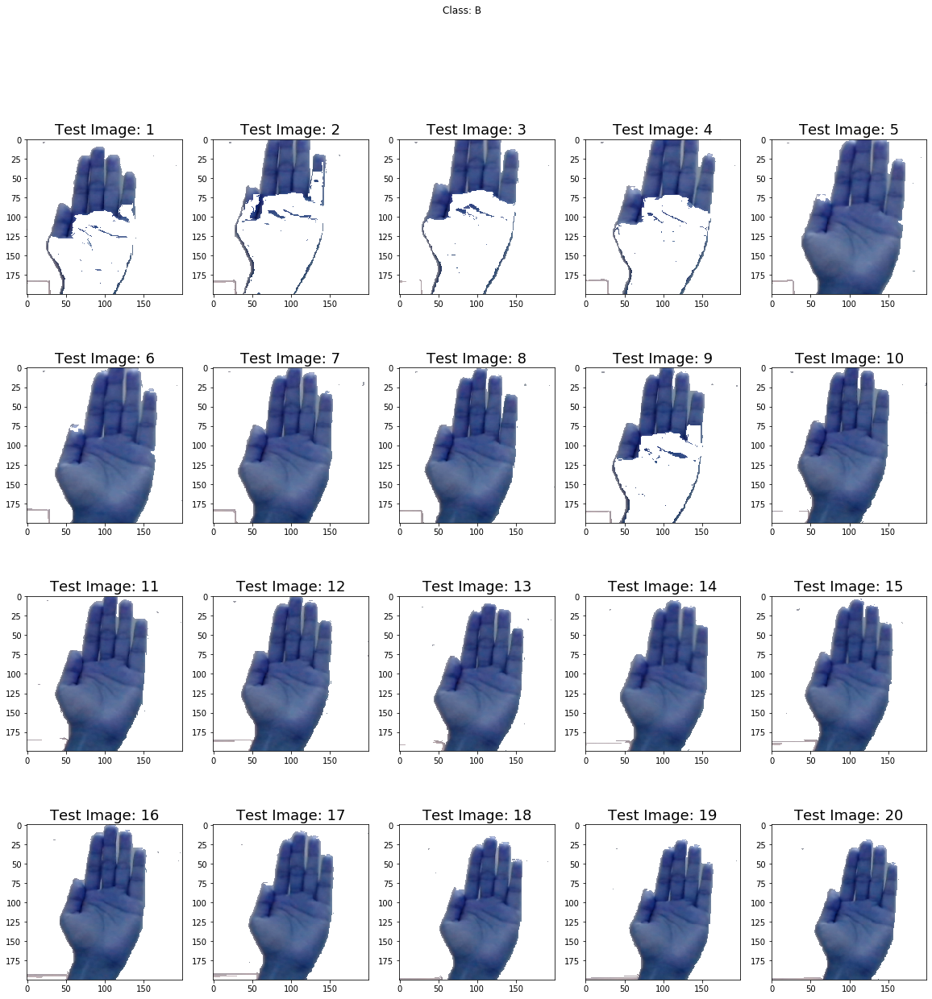

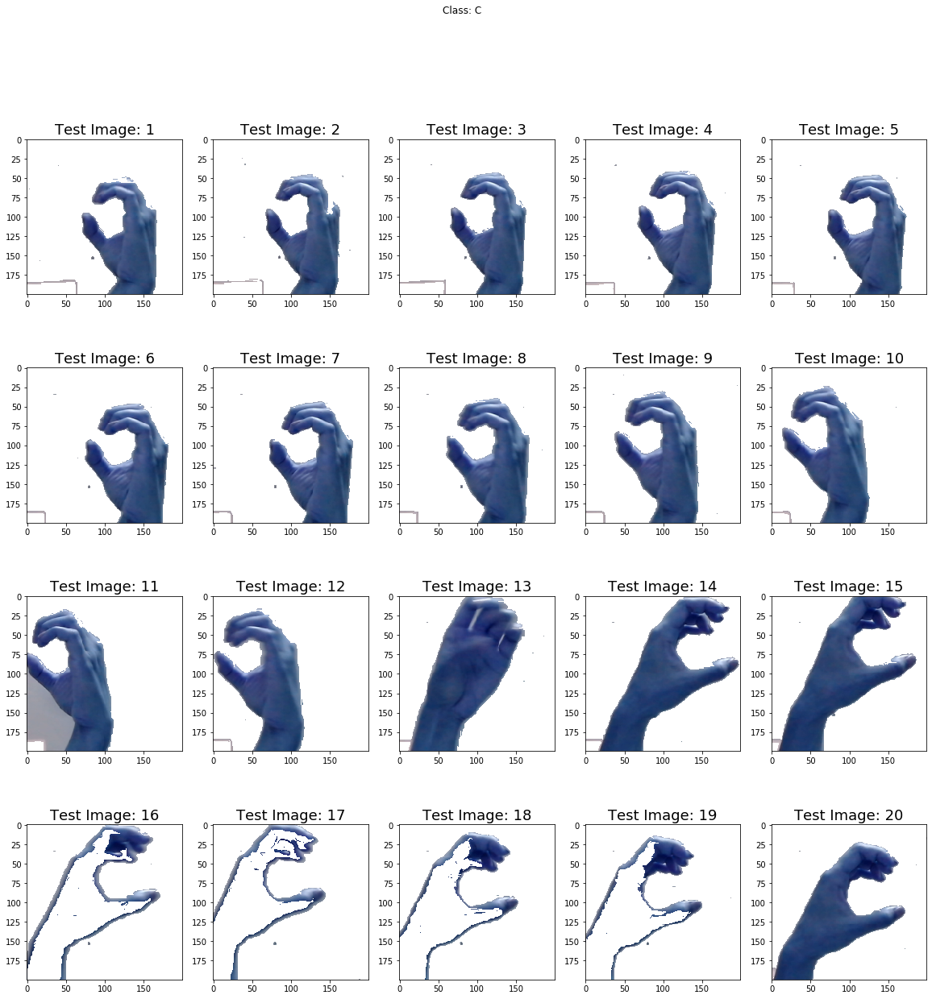

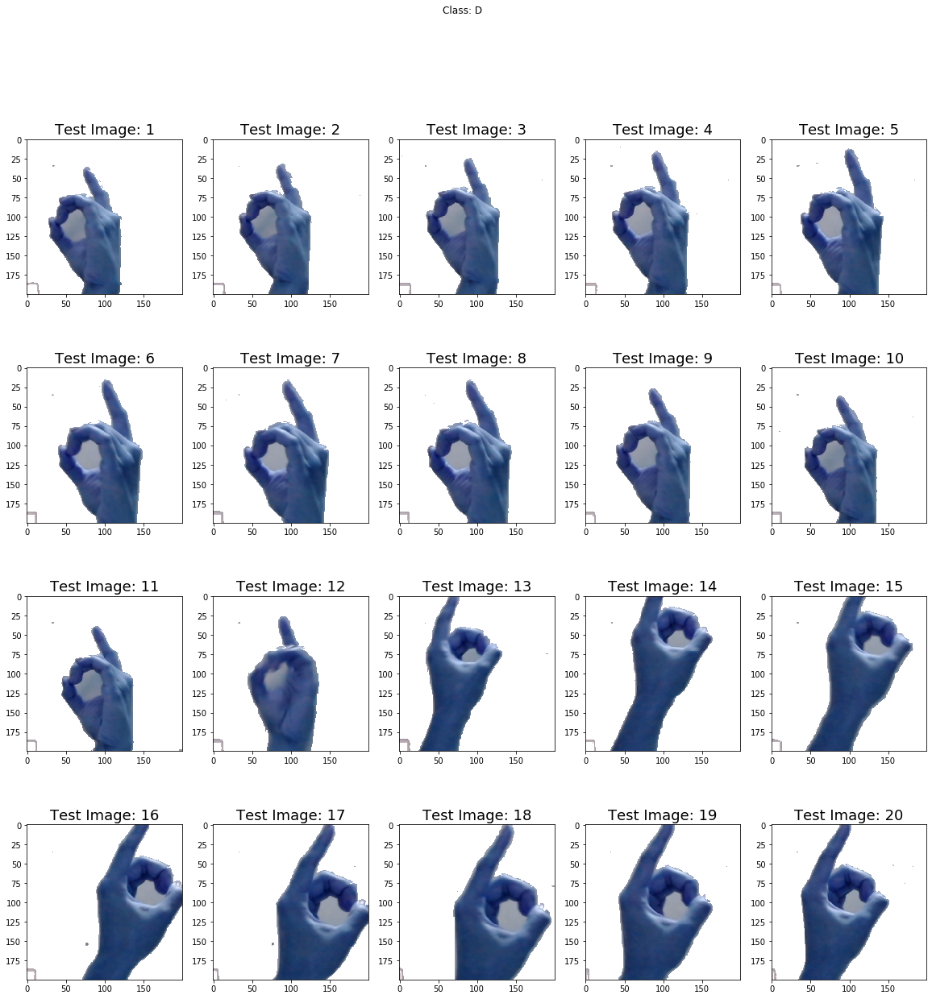

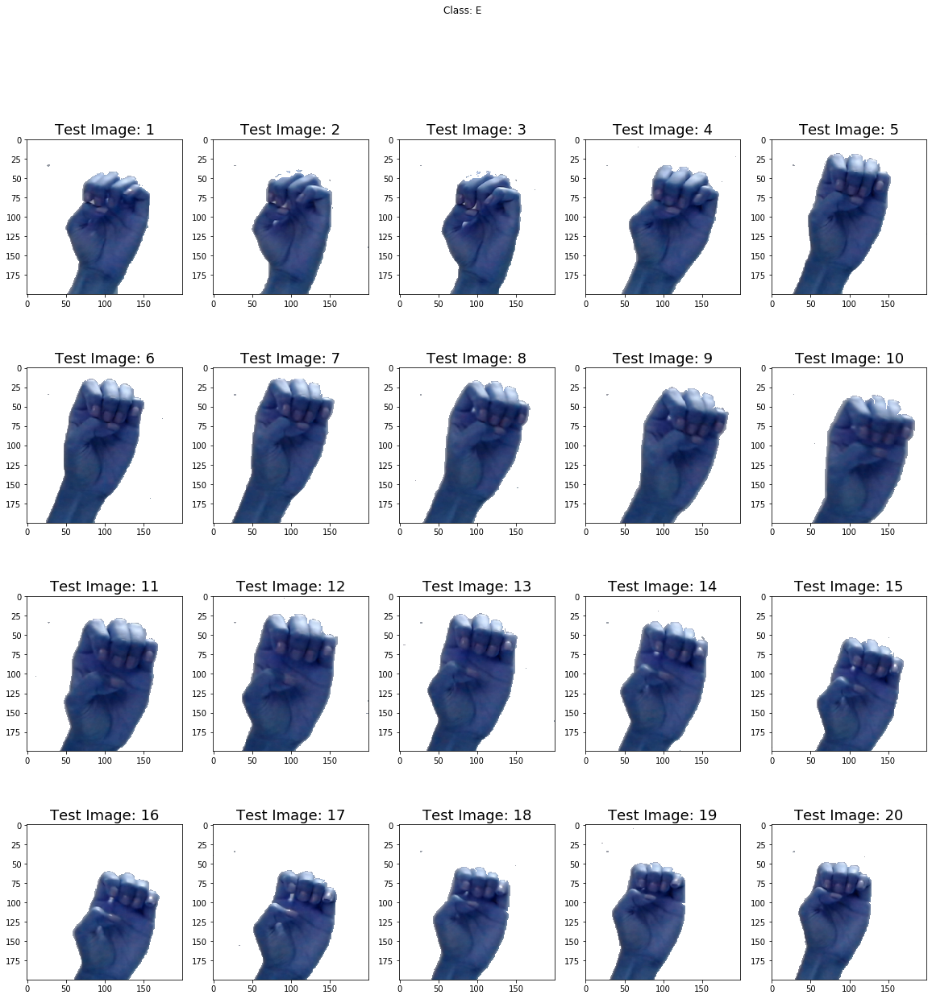

...

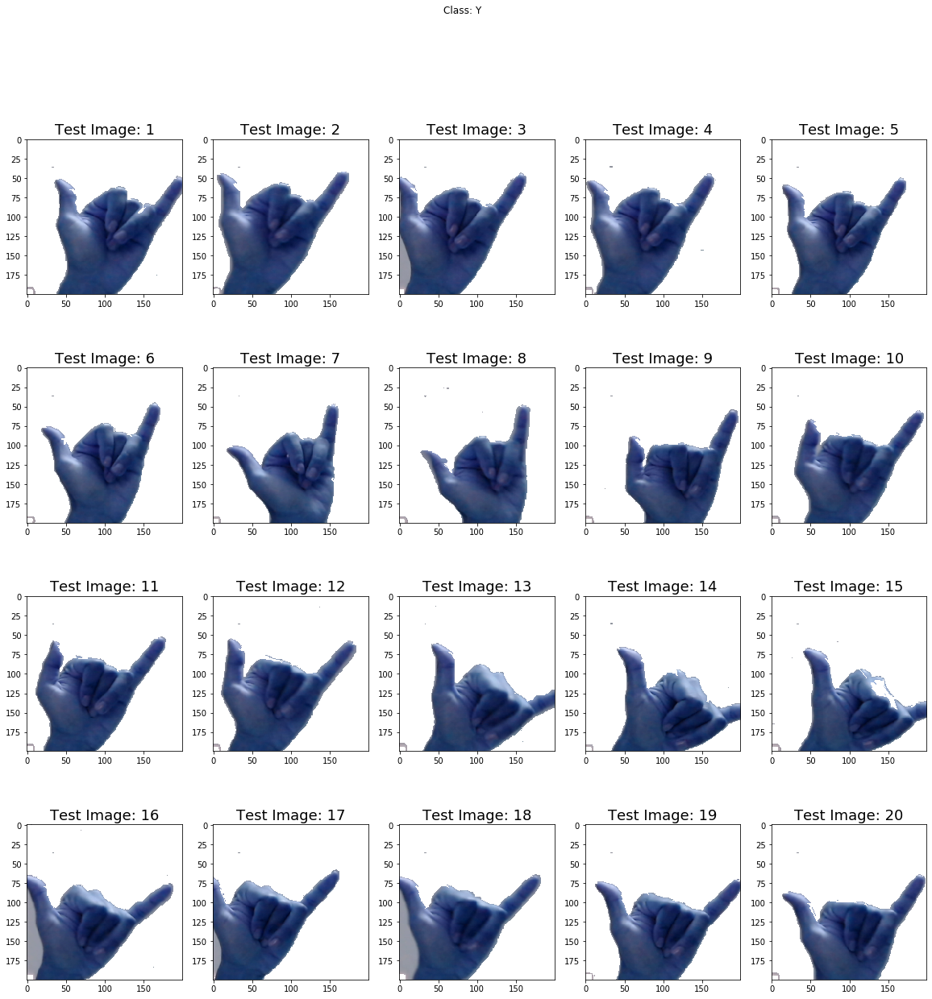

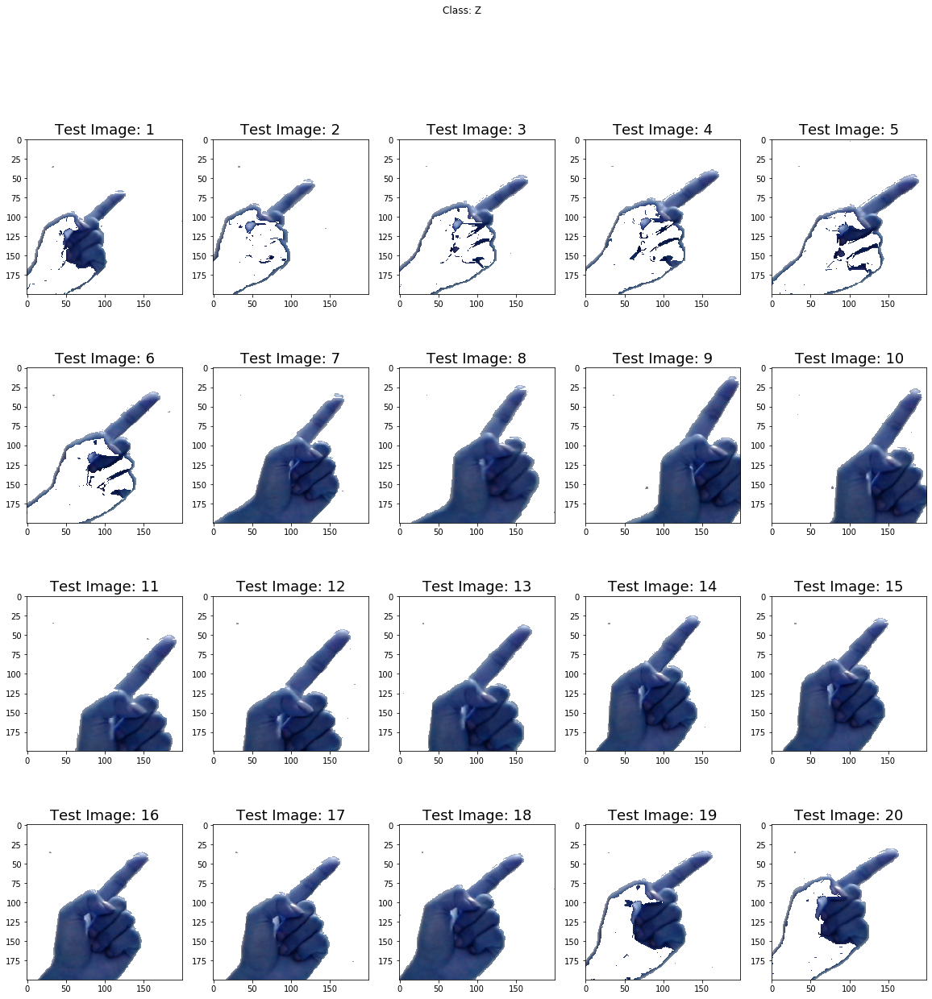

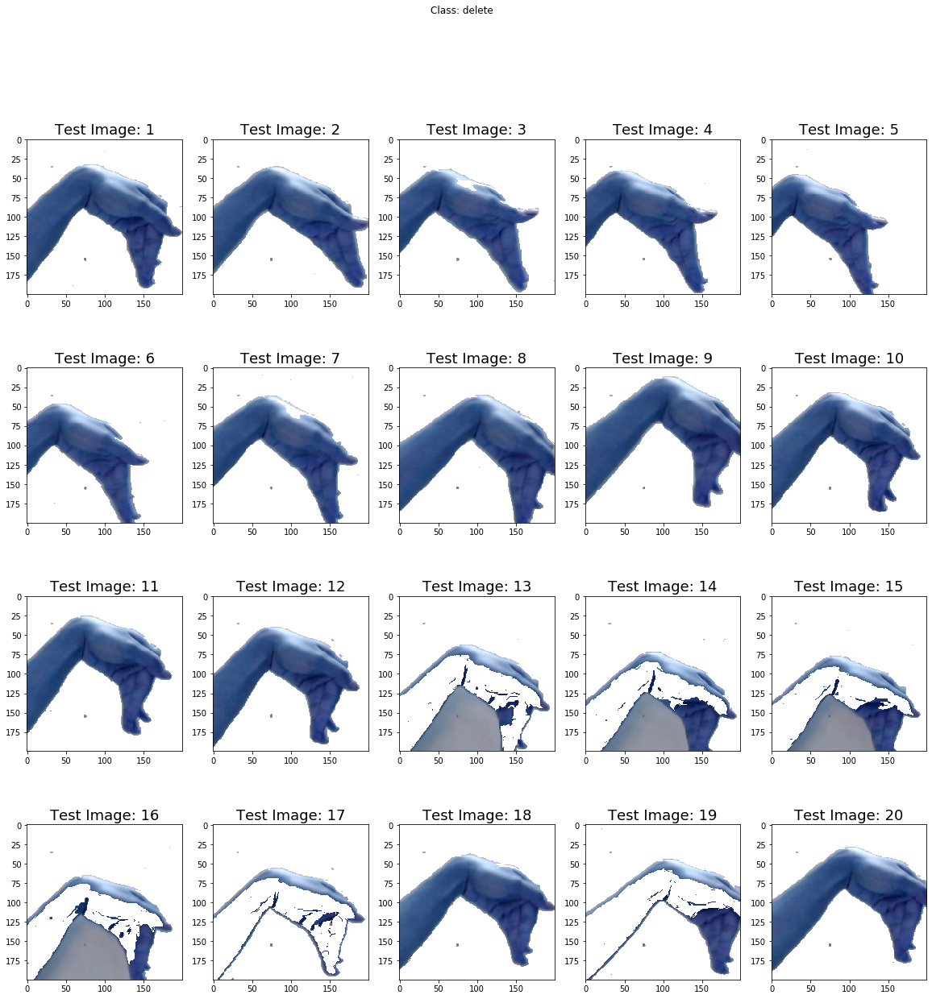

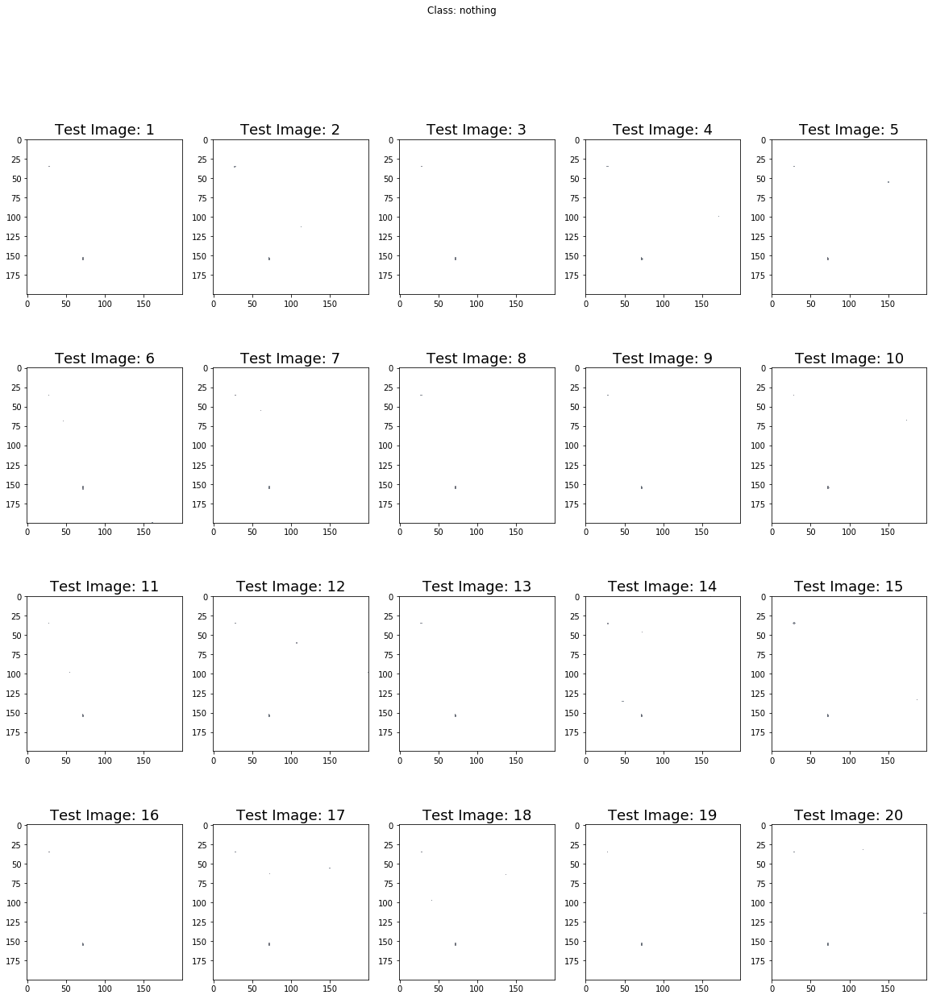

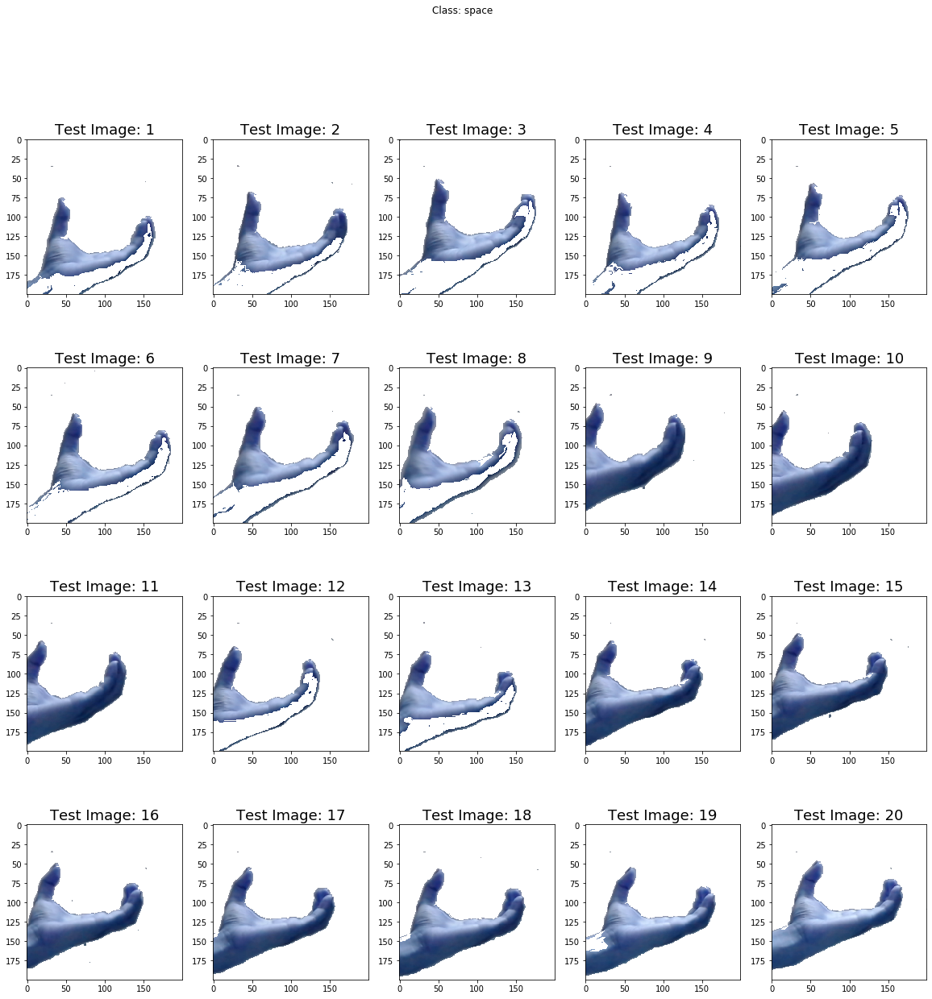

In [10]:
for letter in LETTER_LIST:

    # Displaying the obtained test images for class 0 : paper
    plt.subplots(4,5,figsize=(20,20))
    
    # Title
    plt.suptitle(f'Class: {letter}')

    # Iterating through the 20 images
    for i in np.arange(1,21):

        # Plotting the image    
        plt.subplot(4,5,i)

        plt.imshow(dict_images[letter][i-1])

        # Adding a title
        plt.title(f'Test Image: {i}', fontsize=18)

    # Show the images 
    plt.show()

### Getting the accuracy scores 

In [11]:
# Looping through the models
for model in col_names[:-1]:
    
    # Print Accuracy Scores
    print(f'{model} score: {accuracy_score(df_predictions["true"], df_predictions[model])} \n')

vgg16 score: 0.5672413793103448 

vgg19 score: 0.5913793103448276 

xception score: 0.034482758620689655 

xception_nofc score: 0.034482758620689655 

squeezenet score: 0.49482758620689654 



### Now the Classification Reports

In [12]:
# Looping through the models
for model in col_names[:-1]:

    # Displaying the classification report for the validation set
    print(f'{model} Classification Report\n \n', 
          classification_report(df_predictions['true'], df_predictions[model], 
                                target_names=LETTER_LIST),'\n\n')

vgg16 Classification Report
 
               precision    recall  f1-score   support

           A       1.00      1.00      1.00        20
           B       1.00      0.95      0.97        20
           C       0.50      0.20      0.29        20
           D       0.93      0.65      0.76        20
           E       0.33      0.10      0.15        20
           F       1.00      0.25      0.40        20
           G       0.20      0.30      0.24        20
           H       0.33      0.05      0.09        20
           I       1.00      0.95      0.97        20
           J       0.95      1.00      0.98        20
           K       0.43      0.60      0.50        20
           L       0.93      0.65      0.76        20
           M       0.50      0.05      0.09        20
           N       0.00      0.00      0.00        20
           O       0.61      1.00      0.75        20
           P       0.00      0.00      0.00        20
           Q       0.50      0.20      0.29       

C:\Users\overkill\Anaconda3\envs\deep_cpu\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


### Now confusion matrices

Visualizing confusion matrices as heatmaps but with normalized values 

Plotting the normalized confusion matrix (proportion of predictions by class) as a heatmap


vgg16



,Predicted A,Predicted B,Predicted C,Predicted D,Predicted E,Predicted F,Predicted G,Predicted H,Predicted I,Predicted J,...,Predicted T,Predicted U,Predicted V,Predicted W,Predicted X,Predicted Y,Predicted Z,Predicted delete,Predicted nothing,Predicted space
True A,20,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
True B,0,19,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
True C,0,0,4,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,7,0,0
True D,0,0,0,13,0,0,0,0,0,0,...,0,0,0,0,3,0,0,1,0,0
True E,0,0,0,0,2,0,0,0,0,0,...,0,0,0,0,0,0,0,9,0,0
True F,0,0,0,0,0,5,0,0,0,0,...,4,0,0,0,0,6,0,0,0,1
True G,0,0,0,0,0,0,6,0,0,0,...,0,0,0,0,11,0,0,0,0,0
True H,0,0,0,0,4,0,12,1,0,0,...,0,0,0,0,0,0,0,0,0,0
True I,0,0,0,0,0,0,0,0,19,0,...,0,0,0,0,1,0,0,0,0,0
True J,0,0,0,0,0,0,0,0,0,20,...,0,0,0,0,0,0,0,0,0,0


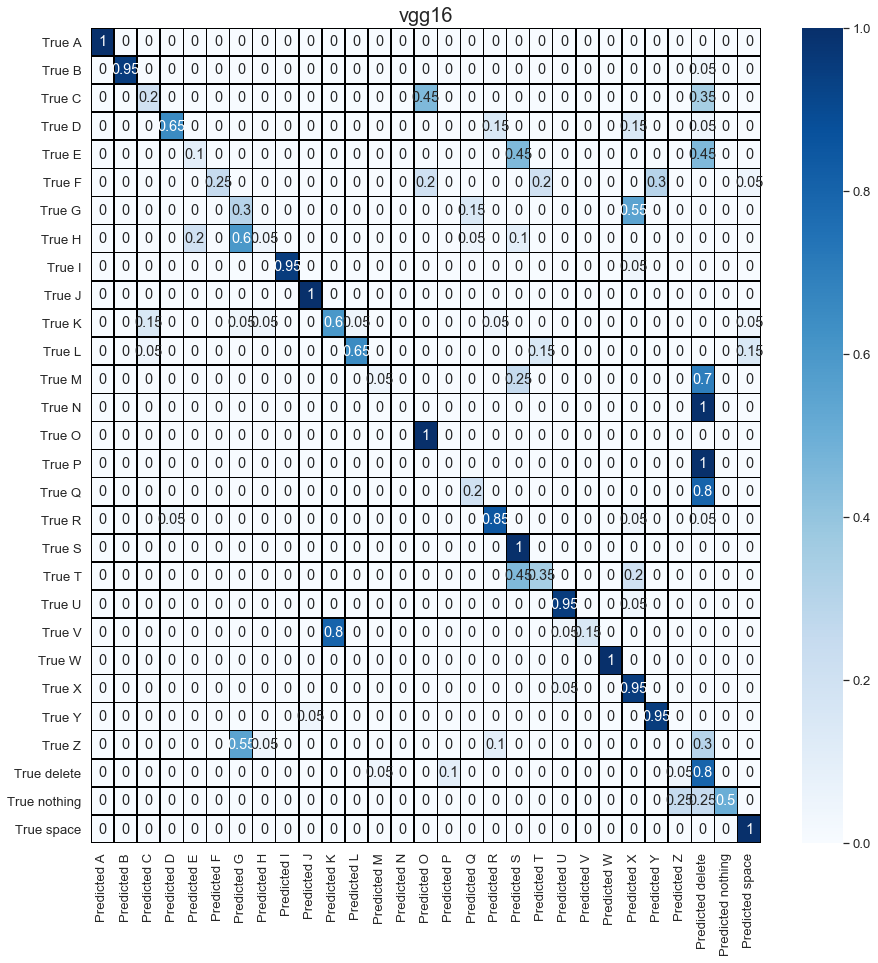


vgg19



,Predicted A,Predicted B,Predicted C,Predicted D,Predicted E,Predicted F,Predicted G,Predicted H,Predicted I,Predicted J,...,Predicted T,Predicted U,Predicted V,Predicted W,Predicted X,Predicted Y,Predicted Z,Predicted delete,Predicted nothing,Predicted space
True A,20,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
True B,0,14,0,0,0,0,0,0,0,0,...,0,0,0,2,0,0,0,0,0,1
True C,0,0,6,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,1,0,0
True D,0,0,0,18,0,0,0,0,1,0,...,0,0,0,0,1,0,0,0,0,0
True E,1,1,0,0,10,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
True F,0,0,0,0,0,0,0,0,0,0,...,1,0,0,16,0,0,0,0,0,0
True G,0,0,0,0,0,0,20,0,0,0,...,0,0,0,0,0,0,0,0,0,0
True H,0,0,0,0,0,0,0,1,0,17,...,0,0,0,0,0,0,0,0,0,1
True I,0,0,0,0,0,0,0,0,20,0,...,0,0,0,0,0,0,0,0,0,0
True J,0,0,0,0,0,0,0,0,0,20,...,0,0,0,0,0,0,0,0,0,0


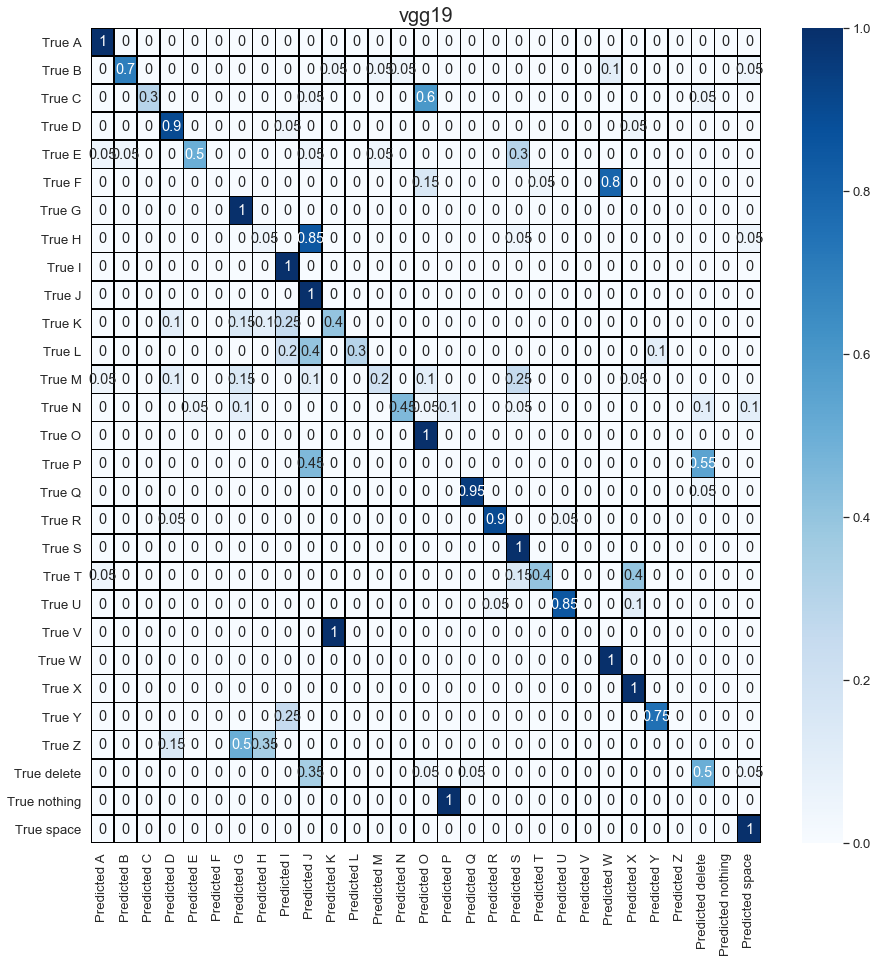


xception



,Predicted A,Predicted B,Predicted C,Predicted D,Predicted E,Predicted F,Predicted G,Predicted H,Predicted I,Predicted J,...,Predicted T,Predicted U,Predicted V,Predicted W,Predicted X,Predicted Y,Predicted Z,Predicted delete,Predicted nothing,Predicted space
True A,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
True B,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
True C,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
True D,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
True E,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
True F,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
True G,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
True H,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
True I,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
True J,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


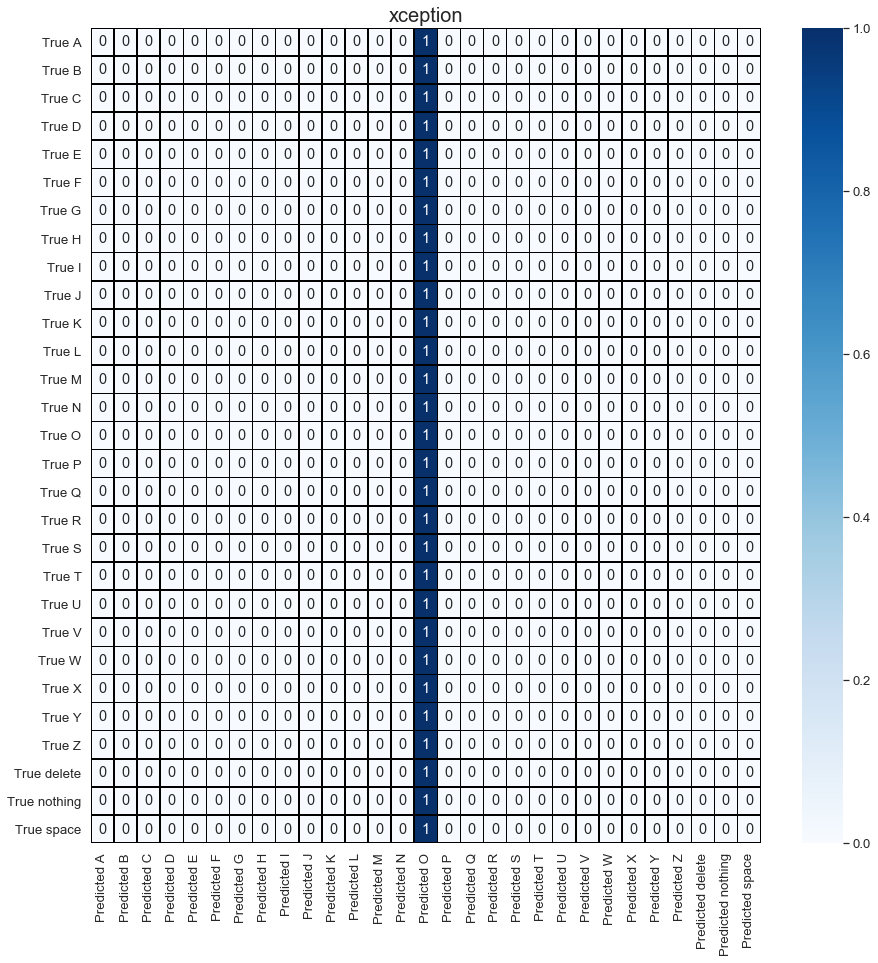


xception_nofc



,Predicted A,Predicted B,Predicted C,Predicted D,Predicted E,Predicted F,Predicted G,Predicted H,Predicted I,Predicted J,...,Predicted T,Predicted U,Predicted V,Predicted W,Predicted X,Predicted Y,Predicted Z,Predicted delete,Predicted nothing,Predicted space
True A,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,20,0,0,0
True B,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,20,0,0,0
True C,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,20,0,0,0
True D,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,20,0,0,0
True E,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,20,0,0,0
True F,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,20,0,0,0
True G,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,20,0,0,0
True H,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,20,0,0,0
True I,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,20,0,0,0
True J,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,20,0,0,0


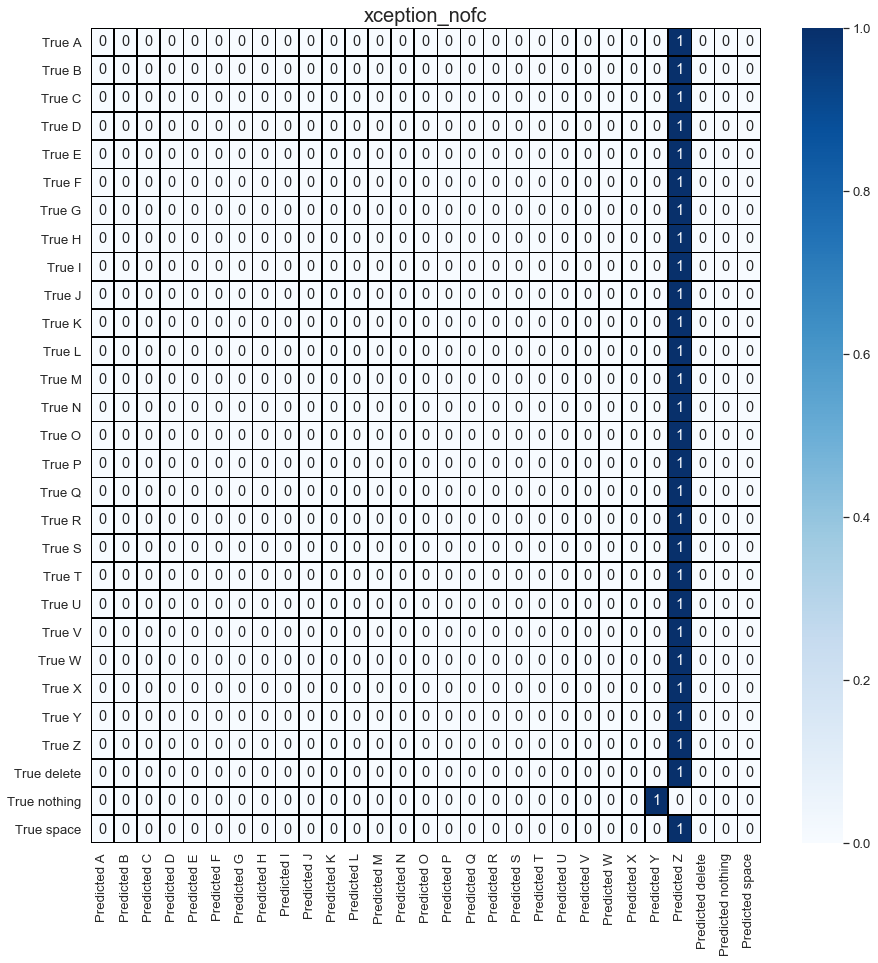


squeezenet



,Predicted A,Predicted B,Predicted C,Predicted D,Predicted E,Predicted F,Predicted G,Predicted H,Predicted I,Predicted J,...,Predicted T,Predicted U,Predicted V,Predicted W,Predicted X,Predicted Y,Predicted Z,Predicted delete,Predicted nothing,Predicted space
True A,18,0,0,0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
True B,0,16,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
True C,0,0,17,0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
True D,0,0,0,10,1,9,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
True E,0,0,0,0,20,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
True F,0,0,0,0,0,20,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
True G,0,0,0,0,0,0,20,0,0,0,...,0,0,0,0,0,0,0,0,0,0
True H,0,0,0,0,7,0,0,13,0,0,...,0,0,0,0,0,0,0,0,0,0
True I,0,0,0,0,0,4,0,0,16,0,...,0,0,0,0,0,0,0,0,0,0
True J,0,0,0,0,0,0,9,0,0,9,...,0,0,0,0,0,0,2,0,0,0


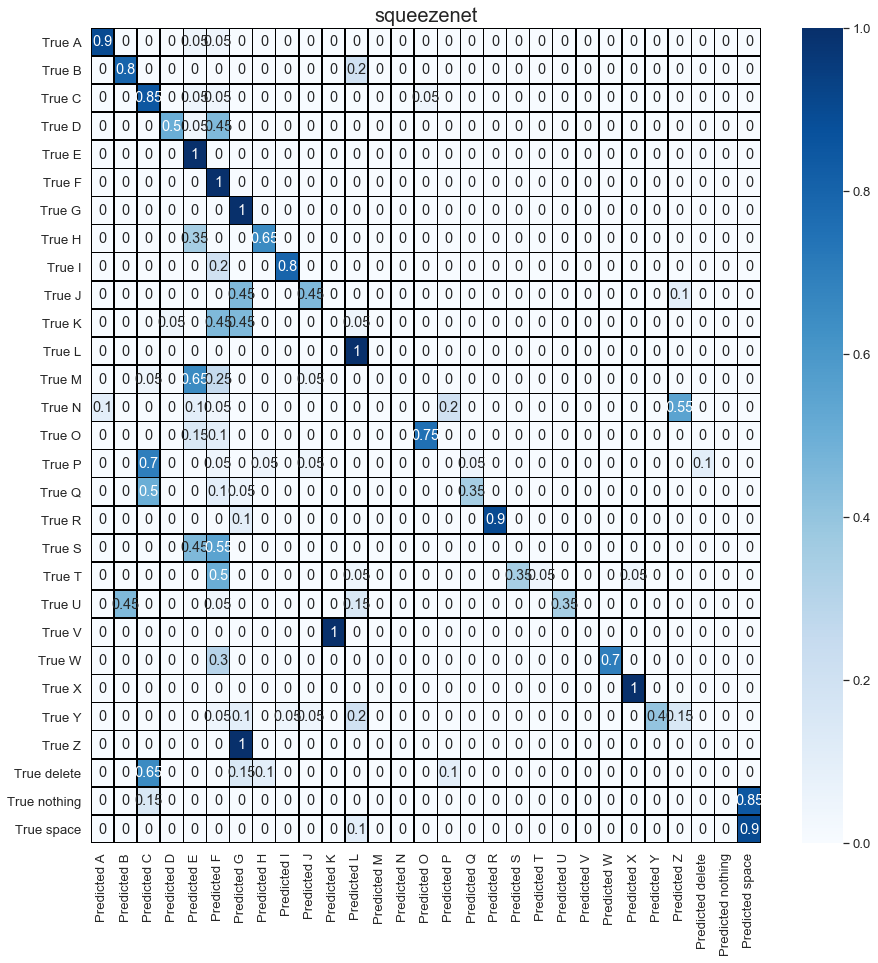

In [13]:
# Larger fontsize
sns.set(font_scale=1.2)

# Looping through the models
for model in col_names[:-1]:
    
    # Title
    print(f'\n{model}\n')
    
    # Creating a non-normalized confusion matrix for the validation set
    matrix = pd.DataFrame(confusion_matrix(df_predictions['true'], df_predictions[model]), 
                          columns=predicted_labels, index=true_labels)
    # Show it 
    display(matrix)
    
    # Creating the figure
    plt.figure(figsize=(15,15))
    
    sns.heatmap(round(matrix/matrix.sum(axis=1)[:,np.newaxis],2),
                # Formatting the figure
                cmap='Blues', annot=True, linewidths=.5, linecolor='black')

    # Formatting the title
    plt.title(model, fontsize=20)

    # Display the heatmap
    plt.show()

VGG19, VGG16 and SqueezeNet performed best when faced with webcam images taken in real-time, respectively. Xception performed the worst by far. 